Project: Finding Lane Lines on the Road
-------------------------------------

In the first project I will attempt use the new algorithm that I learnt to detect lanes in the test images and video.

The follwoing will be my approach,

1. Import image and define all necessary helper functions
2. Gray Scale Images
3. Apply Gaussian Filter to reduce noise
4. Canny Edge detection to identify the edges from the image
5. Select region of intrest
6. Mask unwanted region
7. Identify the lanes using Hough transform
8. Determine slope and intercept and segerate to left and right lane, Extrapolate to left and right lane
9. Draw the lanes on the image

Process Video using the built pipeline
------------------------------------

The given video will be processed using moviepy library and above built pipeline for lane detection on a image.
The following steps are 

1. Import necessary libraries and input video paths
2. Process video in images and apply necessary preprocessing.
3. Use pipeline for lane detection on each line
4. Combine images to form the output video


Step 1
------
Import Necessary Libraries and Image

In [3]:
import os
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import cm
import numpy as np
import cv2
%matplotlib inline

In [4]:
# A function to display a given set of Images
def disp_image(images, disp_option=None):
    '''
    This function loops through the images read by matplotlib image and plots them as n by 2 columns
    '''
    width = 24
    height = 24
    plt.figure(figsize=(width, height))
    ncols = 2
    nrows = (len(images)+1) // ncols
    for idx,img in enumerate(images):
        plt.subplot(nrows,ncols, idx+1)
        if not disp_option:
            plt.imshow(img)
        else:
            plt.imshow(img, cmap=disp_option)
    plt.tight_layout()
    plt.show()
        

In [5]:
# A function to save a given set of Images to the output Directory
def save_image(images, filenamelist, add_string, cmap=None):
    '''
    This fucntion loops through the images and save them to the ouput directory
    '''
    outputpath = "test_images_output"
    new_file_name = [fname.replace(".jpg", add_string + ".jpg") for fname in filenamelist]
    new_file_path = [os.path.join(outputpath, os.path.basename(ffile)) for ffile in new_file_name]
    for idx,img in enumerate(images):
        if not cmap:
            plt.imsave(new_file_path[idx], img)
        else:
            plt.imsave(new_file_path[idx], img, cmap=cmap)

In [6]:
def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

In [7]:
def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

In [8]:
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

In [9]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [10]:
def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    """
    # make a copy of the original image
    image = np.copy(img)
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(image, (x1, y1), (x2, y2), color, thickness)
    return image

In [11]:
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    return lines

In [12]:
def weighted_img(img, initial_img, α=1., β=0.95, λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

In [72]:
def avg_slope_intercept(lines):
    '''
    Function to average slope and intercept of left and right lanes
    '''
    Left_Lane = []
    Right_Lane = []
    left_slope = 0
    right_slope = 0
    left_inter = 0
    right_inter = 0
    lcount = 0
    rcount = 0
    for idx,line in enumerate(lines):
        for x1,y1,x2,y2 in line:
            slope = ((y2-y1)/(x2-x1))
            intercept = y2 - (slope * x2)
            # Positive Slope is Left Lane and Negative is Right
            if slope > 0:
                Left_Lane.append(line)
                left_slope += slope
                left_inter += intercept
                lcount += 1
            elif slope < 0:
                Right_Lane.append(line)
                right_slope += slope
                right_inter += intercept
                rcount += 1
            else:
                #ignore vertical lines
                pass
    avg_left_slope = left_slope / lcount
    avg_left_inter = left_inter / lcount
    avg_right_slope = right_slope / rcount
    avg_right_inter = right_inter / rcount
    
    return avg_left_slope,avg_left_inter,avg_right_slope,avg_right_inter

In [14]:
def get_lanes_points(y1, y2, slope, intercept):
    '''
    This function converts the y points, slope and intercept to line points
    '''
    x1 = int((y1 - intercept)/slope)
    x2 = int((y2 - intercept)/slope)
    y1 = int(y1)
    y2 = int(y2)
    
    return ((x1,y1,x2,y2))

In [15]:
def make_lanes(image, lines):
    '''
    This function receives the hough lines and returns cordinates for long left and right lane
    '''
    avg_left_slope,avg_left_inter,avg_right_slope,avg_right_inter = avg_slope_intercept(lines)
    
    # Select two Y points determine the top and bottom of the lane
    
    y1 = image.shape[0]
    y2 = y1 * 0.65
    
    Left_Lane = get_lanes_points(y1, y2, avg_left_slope, avg_left_inter)
    Right_Lane = get_lanes_points(y1, y2, avg_right_slope, avg_right_inter)
    
    return [Left_Lane, Right_Lane]

In [16]:
def draw_continuous(img, lines, color=[255, 0, 0], thickness=2):
    """
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    """
    # make a copy of the original image
    mask_img = np.zeros_like(img)
    image = np.copy(img)
    for line in lines:
        x1,y1,x2,y2 = line
        cv2.line(mask_img, (x1, y1), (x2, y2), color, thickness)
    return weighted_img(mask_img, image)

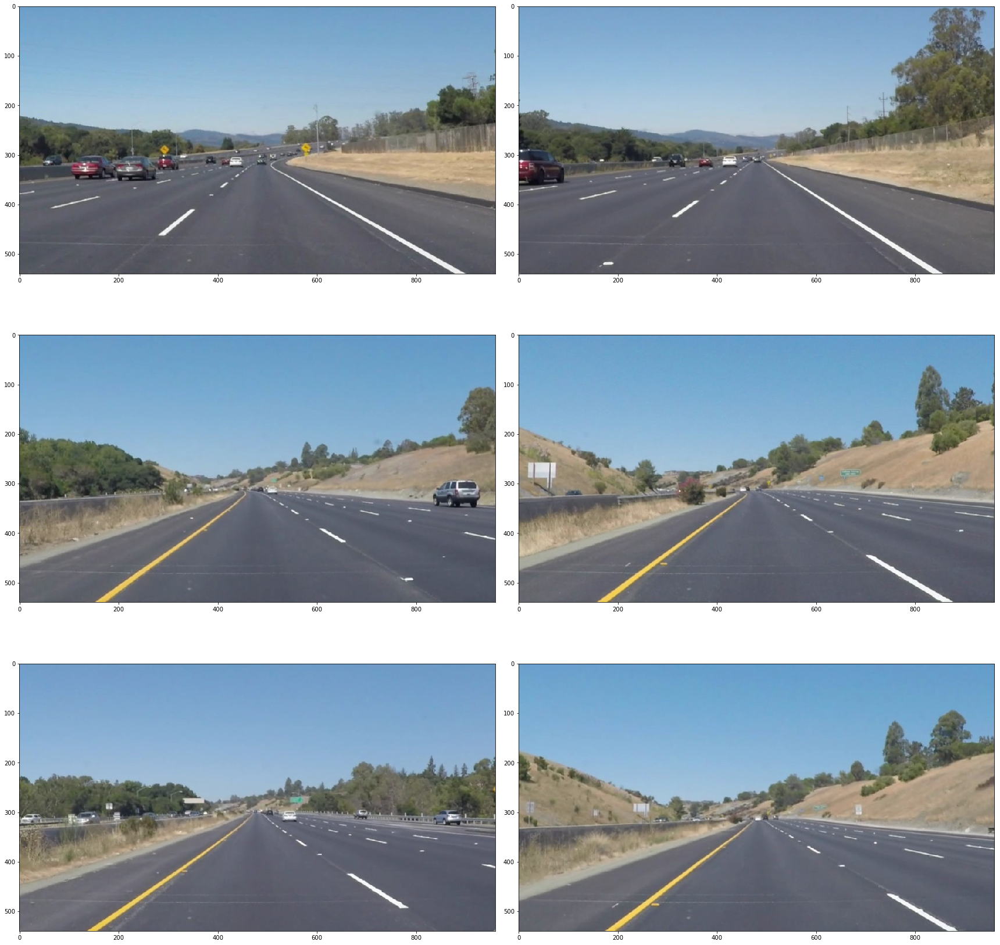

In [17]:
# Get path of all images
Test_Image_files = glob.glob('test_images/*.jpg')

# Read Images
Test_IMG = [mpimg.imread(img) for img in Test_Image_files]

# Display Images to check
disp_image(Test_IMG)

Step 2
------
Convert Images to GrayScale

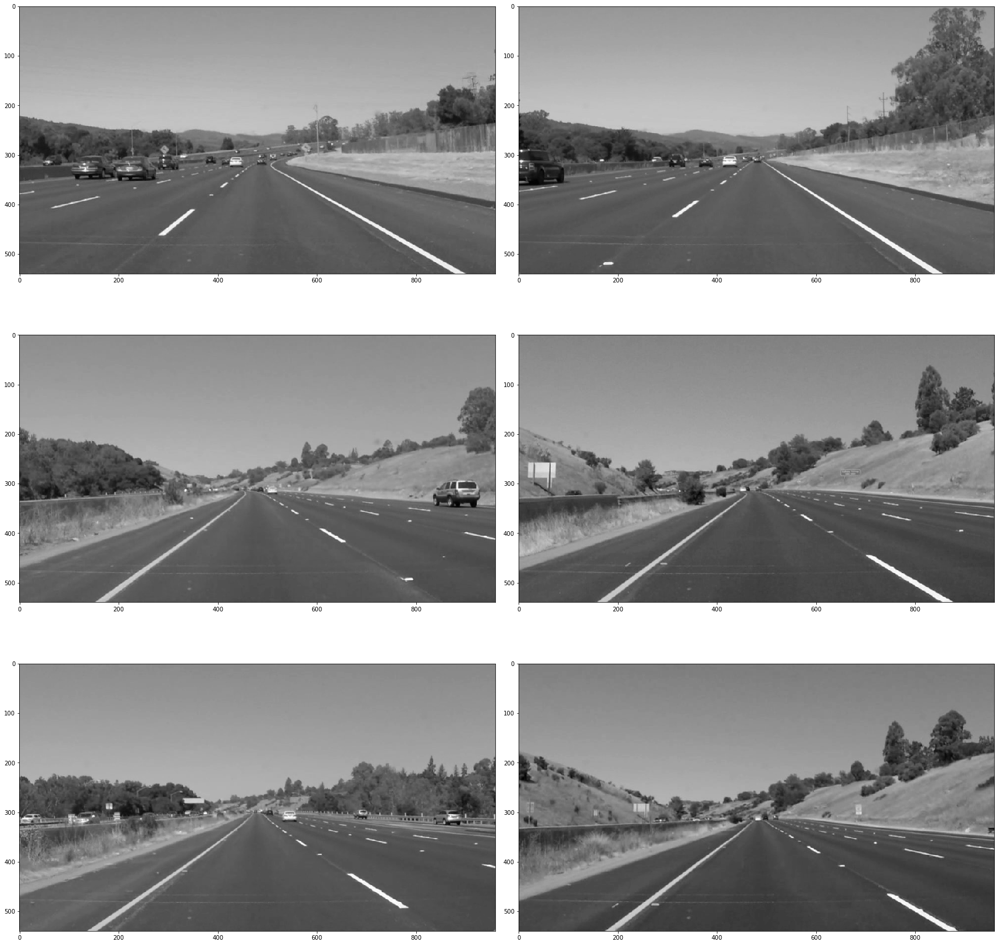

In [18]:
# Call Gray Scale function
Gray_IMG = [grayscale(img) for img in Test_IMG]

# Display Gray Scale Image
disp_image(Gray_IMG, "gray")

# Save Gray Scale Image
save_image(Gray_IMG, Test_Image_files, "GrayScale", cm.gray)

Step 3
------
Applying Gaussian Blur to reduce noise

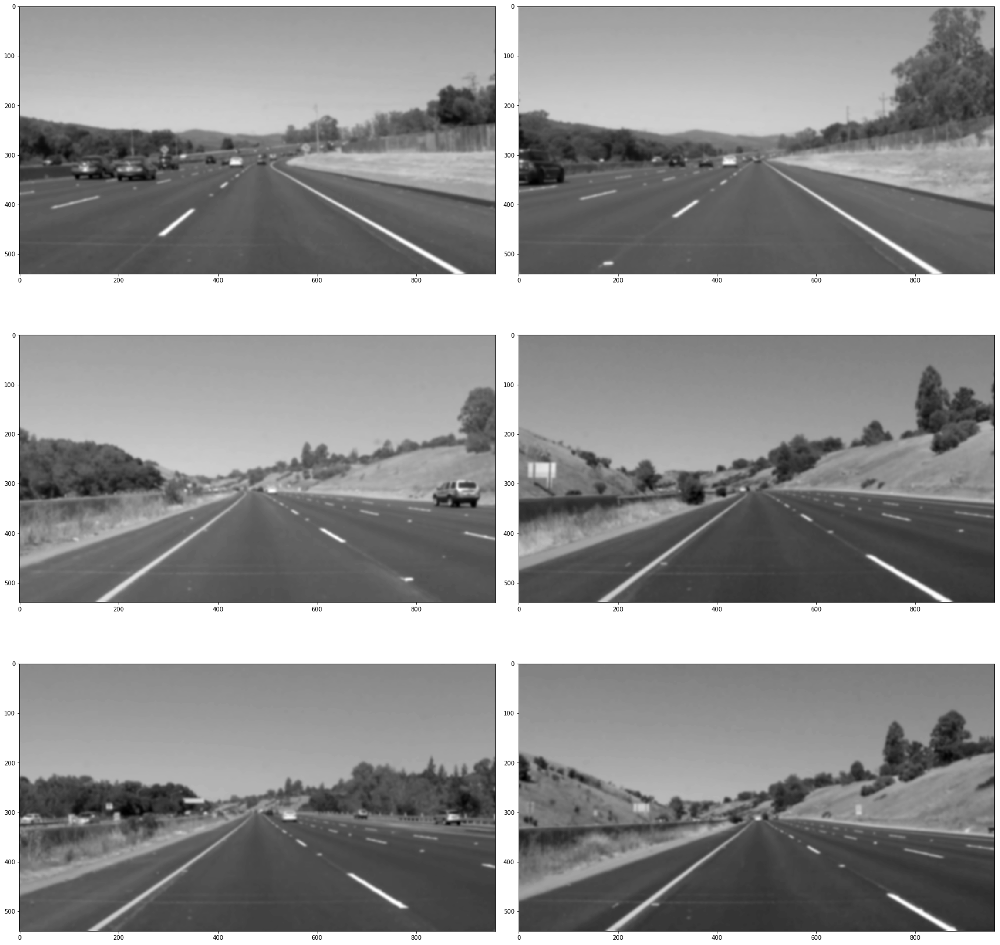

In [19]:
# Apply Gaussian Blur
kernel_size = 11
Gau_IMG = [gaussian_blur(img, kernel_size) for img in Gray_IMG]

# Display Image
disp_image(Gau_IMG, "gray")

# save Image
save_image(Gau_IMG, Test_Image_files, "Gau_Smooth", cm.gray)

Step 4
------
Canny Edge detection to identify the edges from the image

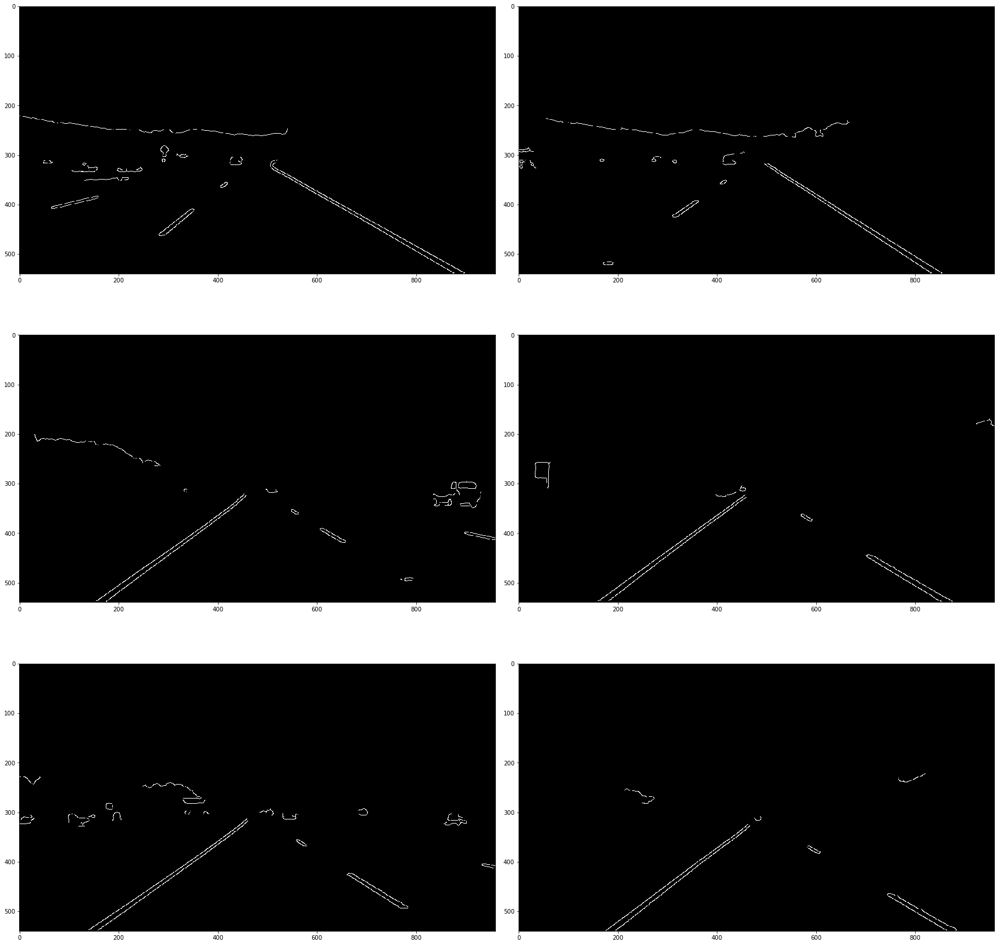

In [20]:
# Set CAnny Thresholds
Low_Threshold = 60
High_Threshold = 180
Canny_IMG = [canny(img, Low_Threshold, High_Threshold) for img in Gau_IMG]

# Display Image
disp_image(Canny_IMG, "gray")

# save Image
save_image(Canny_IMG, Test_Image_files, "Canny", cm.gray)


Step 5
------

Select region of intrest by using the x and y vertices of the each image

In [21]:
Vertices =[]
for img in Test_IMG:
    im_shape = img.shape
    ymax = im_shape[0]
    xmax = im_shape[1]
    bottom_left = (xmax*0.15, ymax*0.95)
    top_left = (xmax*0.42, ymax*0.6)
    top_right = (xmax*0.55, ymax*0.6)
    bottom_right = (xmax*0.9, ymax*0.95)
    vertex = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    Vertices.append(vertex)


Step 6
------
Mask unwanted regions using the selected vertices on the canny edge detected Images

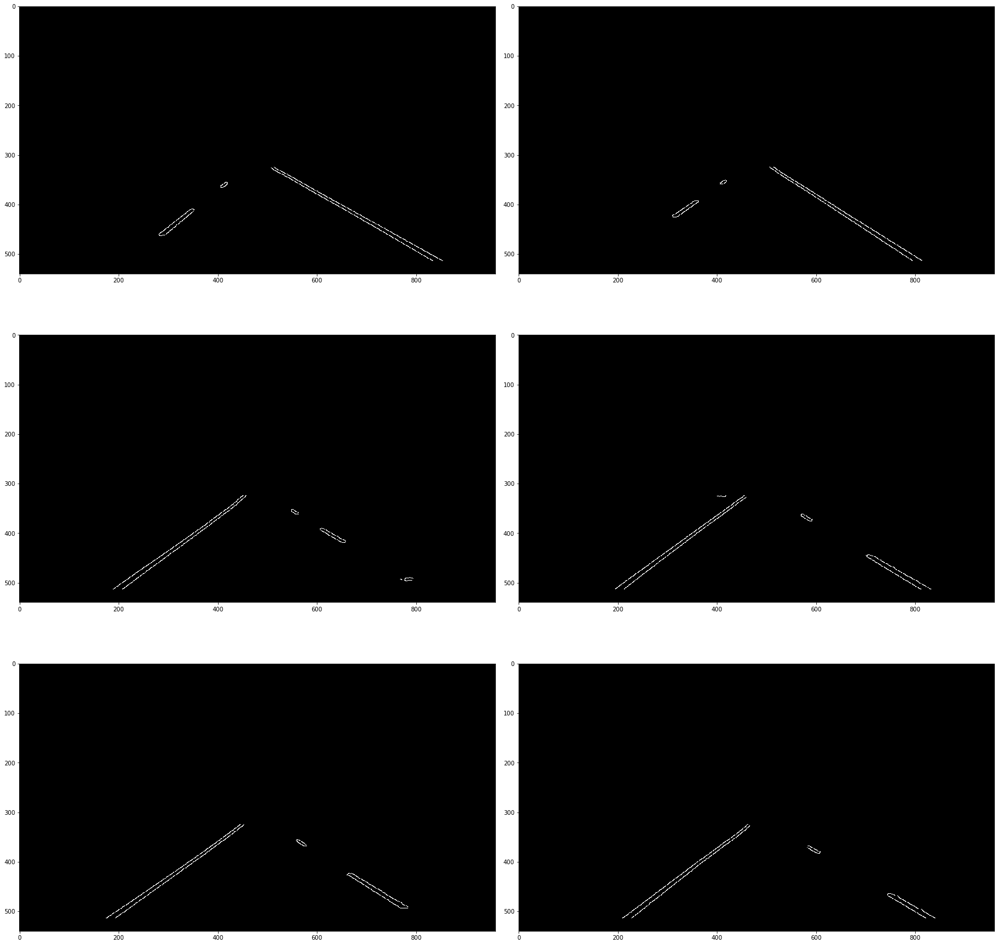

In [22]:
Mask_IMG = [region_of_interest(Canny_IMG[idx], vertex) for idx,vertex in enumerate(Vertices)]
    
# Display Image
disp_image(Mask_IMG, "gray")

# save Image
save_image(Mask_IMG, Test_Image_files, "Masked", cm.gray)


Step 7
-----
Identify the lanes using Hough transform. The correct tunning of Hough transform parameter is key for this function.

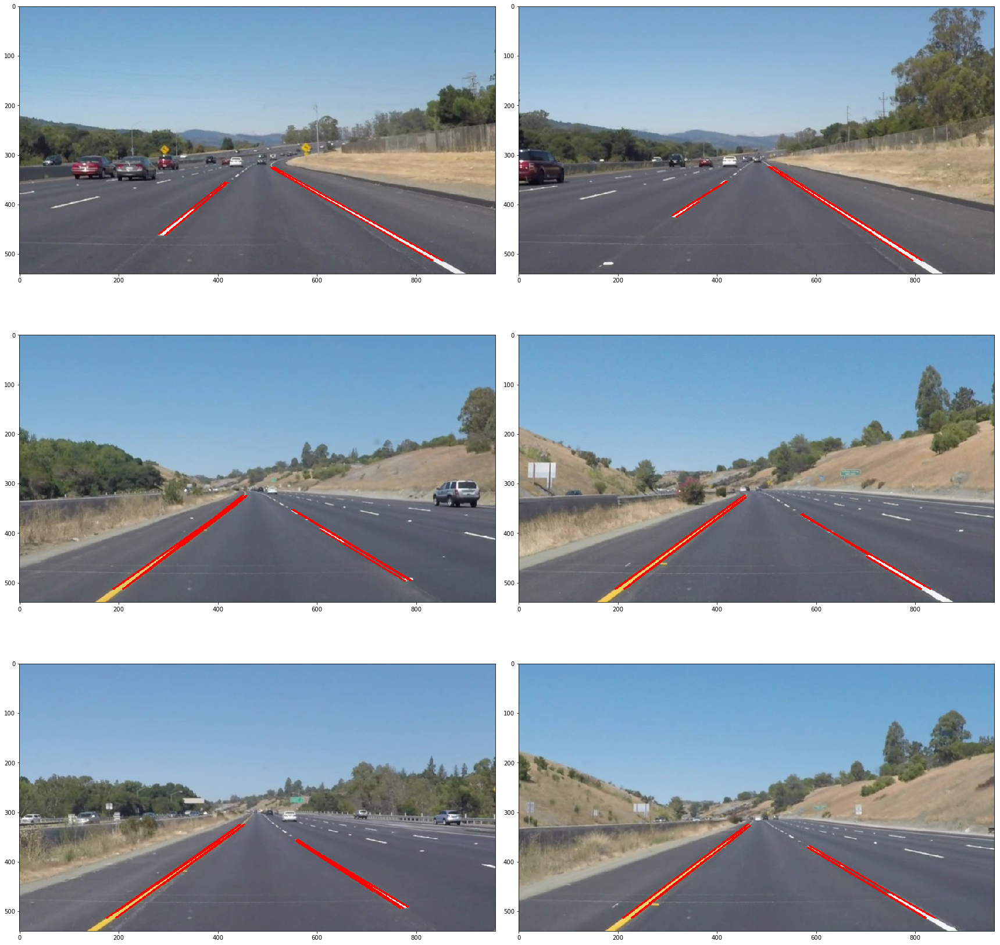

In [23]:
# Setting up Hough transform parameters

# Distance resolution
rho = 1

# Angular resolution
theta = np.pi / 180

# minimum number of vores (Intersection in Hough grid Cell)
threshold = 20

# minimum number of pixels making up a line
min_lin_length = 20

# maximum gap in pixels between connectable line segments
max_line_gap = 300

Hough_Lines = [hough_lines(img, rho, theta, threshold, min_lin_length, max_line_gap) for img in Mask_IMG]

# Draw on Image
Hough_IMG = [draw_lines(Test_IMG[idx], lines) for idx,lines in enumerate(Hough_Lines)]

# Display Image
disp_image(Hough_IMG)

# save Image
save_image(Hough_IMG, Test_Image_files, "Hough")


Step 8
------

Determine the slope and intercept average of each lane. Use this to extrapolate to single lane.


In [24]:
Left_Right_Lanes = [make_lanes(Test_IMG[idx],lines) for idx,lines in enumerate(Hough_Lines)]

In [25]:
MY_LANE_IMG = [draw_continuous(Test_IMG[idx], lanes, thickness=15) for idx,lanes in enumerate(Left_Right_Lanes)]

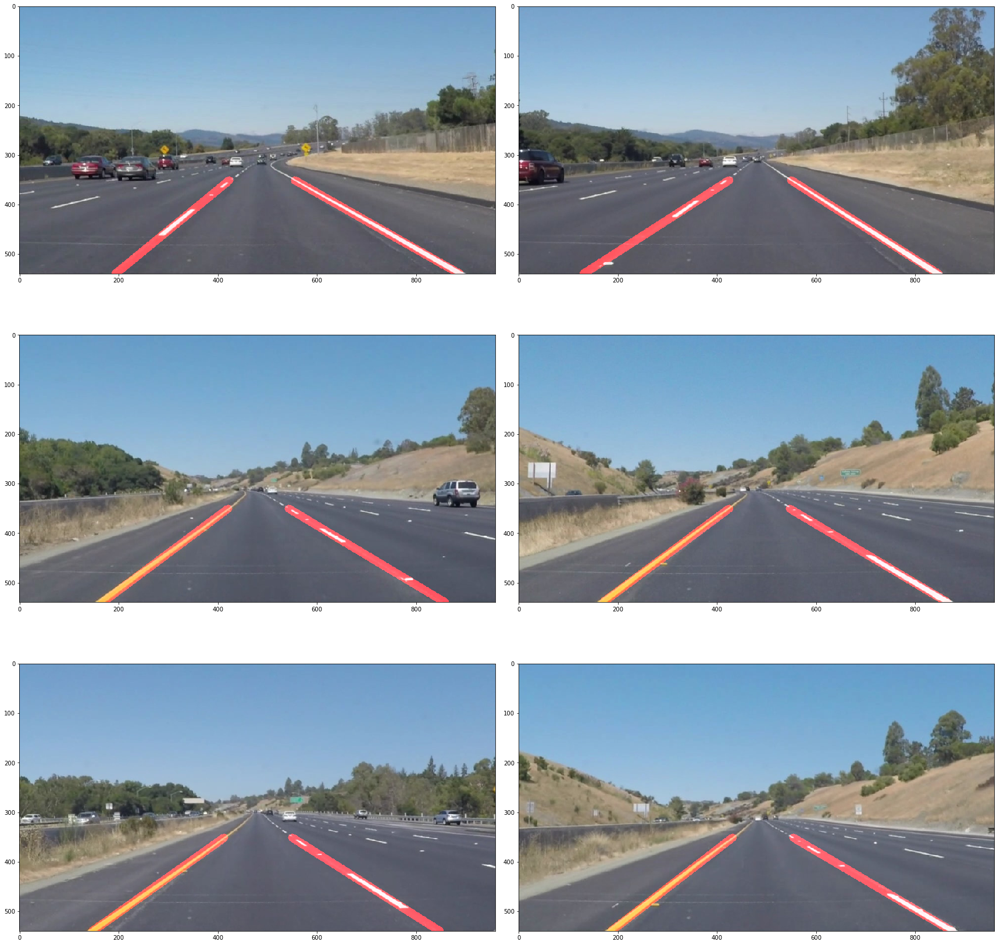

In [26]:
disp_image(MY_LANE_IMG)
save_image(MY_LANE_IMG, Test_Image_files, "Continuous_Detected")

Process Video using the above designed pipeline
--------------------------------------------

Step1
-----

1. Import necessary libraries and define video paths

In [27]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

testVideo1 = ("test_videos/solidWhiteRight.mp4")
testVideo2 = ("test_videos/solidYellowLeft.mp4")
testVideo3 = ("test_videos/challenge.mp4")

outputVideo1 = ("test_video_output/solidWhiteRight_detected.mp4")
outputVideo2 = ("test_video_output/solidYellowLeft_detected.mp4")
outputVideo3 = ("test_video_output/challenge_detected.mp4")


In [81]:
def imageProcessor(image):
    '''
    This function process the give image and return pipeline plotted image
    '''
    print(image)
    # Grayscale
    gray_img = grayscale(image)
    
    # Gaussian Blur
    kernel_size = 11
    gau_img = gaussian_blur(gray_img, kernel_size)
    
    # Canny Edge detection
    Low_Threshold = 60
    High_Threshold = 180
    canny_img = canny(gau_img, Low_Threshold, High_Threshold)
    
    # Set veritices
    im_shape = image.shape
    ymax = im_shape[0]
    xmax = im_shape[1]
    bottom_left = (xmax*0.15, ymax*0.95)
    top_left = (xmax*0.42, ymax*0.6)
    top_right = (xmax*0.55, ymax*0.6)
    bottom_right = (xmax*0.9, ymax*0.95)
    vertex = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    
    # mask image with region of intrest
    mask_img = region_of_interest(canny_img, vertex)
    
    # Hough Transform
    # Setting up Hough transform parameters
    # Distance resolution
    rho = 1
    # Angular resolution
    theta = np.pi / 180
    # minimum number of vores (Intersection in Hough grid Cell)
    threshold = 20
    # minimum number of pixels making up a line
    min_lin_length = 20
    # maximum gap in pixels between connectable line segments
    max_line_gap = 300
    HoughLines = hough_lines(mask_img, rho, theta, threshold, min_lin_length, max_line_gap)

    # Average lines and extrapolate
    left_right_lanes = make_lanes(image,HoughLines)
    detected_image = draw_continuous(image, left_right_lanes, thickness=15)
    plt.imshow(detected_image)
    plt.show()

In [82]:
def videoProcessor(input_video, ouput_video):
    '''
    This function takes an input video and output video file path and process them using the pipeline
    '''
    clip_input = VideoFileClip(input_video)
    clip_processed = clip_input.fl_image(imageProcessor)
    clip_processed.write_videofile(output_video, audio=False)

In [83]:
def inlineVideo(video):
    '''
    This function inlines the given generated output video
    '''
    HTML("""
    <video width="960" height="540" controls>
      <source src="{0}">
    </video>
    """.format(video))

[[[110 150 189]
  [112 152 191]
  [112 152 191]
  ..., 
  [ 84 138 181]
  [ 79 136 178]
  [ 81 138 180]]

 [[110 150 189]
  [112 152 191]
  [112 152 191]
  ..., 
  [ 86 140 183]
  [ 83 140 182]
  [ 84 141 183]]

 [[110 150 189]
  [112 152 191]
  [112 152 191]
  ..., 
  [ 90 142 185]
  [ 86 140 183]
  [ 88 142 185]]

 ..., 
 [[104  84  73]
  [105  85  74]
  [103  83  72]
  ..., 
  [ 90  70  59]
  [104  84  73]
  [109  89  78]]

 [[104  84  73]
  [103  83  72]
  [105  85  74]
  ..., 
  [ 76  56  45]
  [ 87  67  56]
  [ 94  74  63]]

 [[107  87  76]
  [104  84  73]
  [109  89  78]
  ..., 
  [ 67  47  36]
  [ 71  51  40]
  [ 84  64  53]]]


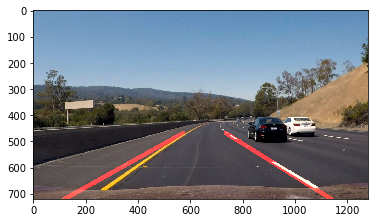

AttributeError: 'NoneType' object has no attribute 'shape'

In [86]:
%time videoProcessor(testVideo3, outputVideo3)